In [1]:
from keras.optimizers import SGD
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tq
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import pickle
from keras.models import load_model
from keras.models import Sequential
from keras.models import Model
from keras.utils.layer_utils import layer_from_config
from keras.layers import *
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing.image import load_img,img_to_array
import itertools
import gc
import heatmap
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.models import model_from_json
from keras.applications.inception_v3 import InceptionV3
from pipeline_functions import *
from keras.models import model_from_json
from utils import *
import heatmaps_to_rect as htr
import meta

Using Theano backend.
DEBUG: nvcc STDOUT nvcc warning : The 'compute_20', 'sm_20', and 'sm_21' architectures are deprecated, and may be removed in a future release (Use -Wno-deprecated-gpu-targets to suppress warning).
mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmp9qmmxkpv/m91973e5c136ea49268a916ff971b7377.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmp9qmmxkpv/m91973e5c136ea49268a916ff971b7377.exp

Using gpu device 0: GeForce GTX 970 (CNMeM is enabled with initial size: 80.0% of memory, cuDNN 5105)
C:\Program Files\Anaconda3\lib\site-packages\theano\sandbox\cuda\__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)


### Given a list of pictures names, we should be able run the entire algorithm on them.

In [2]:
sub_fold = "./Submission/"
mk(sub_fold)
mk(sub_fold + "submission_csv")
mk(sub_fold + "test_data")
mk(sub_fold + "halfway_vectors")
mk(sub_fold + "heatmaps")
mk(sub_fold + "models")

This is what needs to be modified manually

In [19]:
# Precomputing
precompute_network_name = "resnet"
pictures_sizes = [(768, 1216),(1344,2240)]
file_model_precompute = "ResNet_cut.h5"

# Generate heatmaps
file_model_heatmaps = "fish_detection_trained_1.1.h5"
model_heatmaps_name = "simple_first_model"

# Find the boat
boat_classifier_file = ""
treashold = 0.9

# Find rectangles
threshold = 0
ranges=(11,71)
clip = 0.2
border_conf=[(11,3),(71,10)]
batch_size=1
max_fish=2

# Predict
model_predictions = "heatmaps_species.h5"
#model_predictions_weights = "model_8c_500e_R50_1.h5"

In [20]:
# the format of pictures_meta is (filename, height, width)
pictures_meta = meta.create_metadata_test(sub_fold)
fold_precompute = sub_fold+ "halfway_vectors/" + precompute_network_name + "/"
mk(fold_precompute)
fold_heatmaps = sub_fold + "heatmaps/" + model_heatmaps_name + "/"
mk(fold_heatmaps)
path_model_precompute = sub_fold + "models/" + file_model_precompute
path_model_heatmaps = sub_fold + "models/" + file_model_heatmaps
path_model_predictions = sub_fold + "models/" + model_predictions
#path_weights_predictions = sub_fold + "models/" + model_predictions_weights

In [5]:
pictures_meta[0]

('./Submission/test_data/img_00005.jpg', 'img_00005.jpg', 720, 1280)

### We generate mid-network vectors:

In [6]:
generate_intermediary_vectors(pictures_meta, pictures_sizes, fold_precompute, path_model_precompute)

### We compute the heatmaps:

In [6]:
heatmaps = create_heatmaps(pictures_meta, fold_precompute, pictures_sizes, path_model_heatmaps, fold_heatmaps)

In [7]:
heatmaps.shape

(1000, 5, 36, 64)

1.19246077538


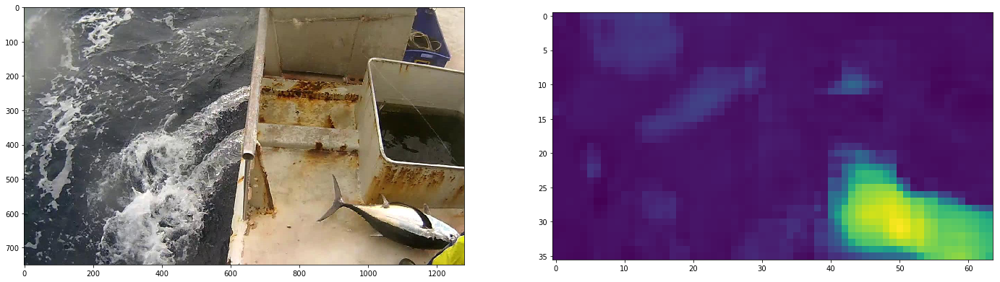

0.609962165356


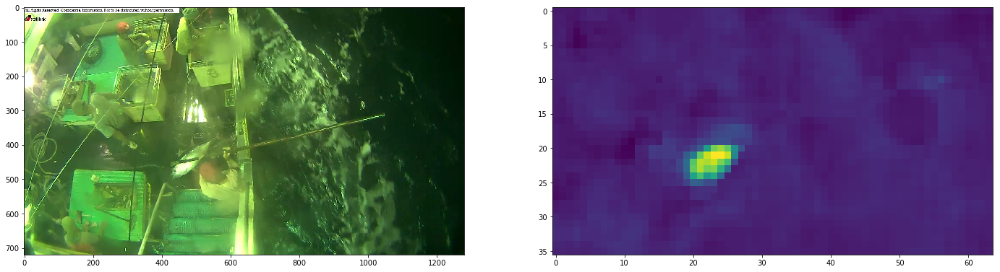

0.376914829016


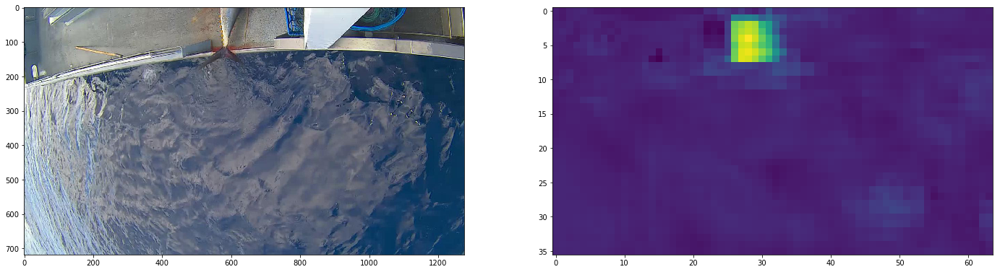

1.10709786415


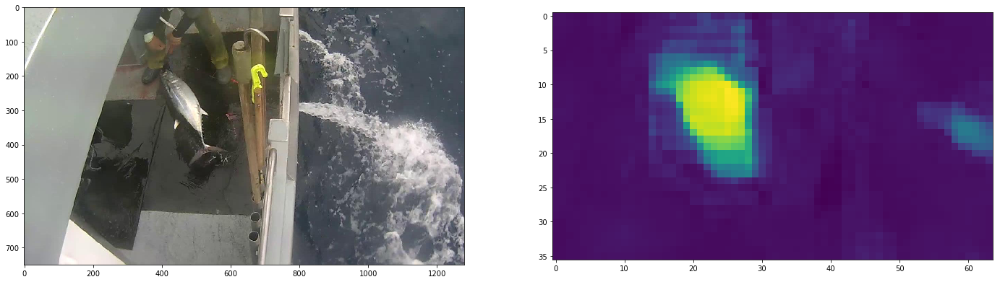

1.12989675999


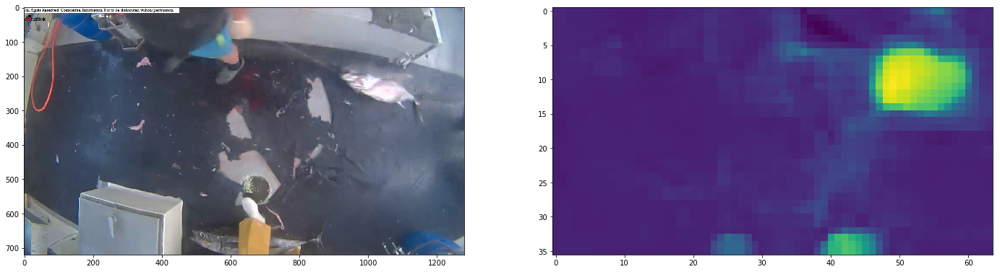

1.15432345867


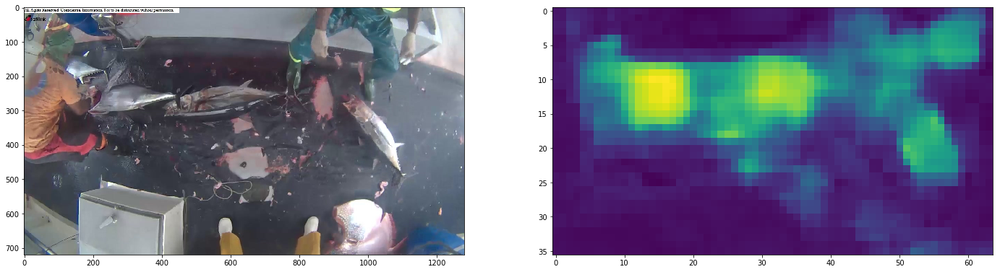

0.618353426456


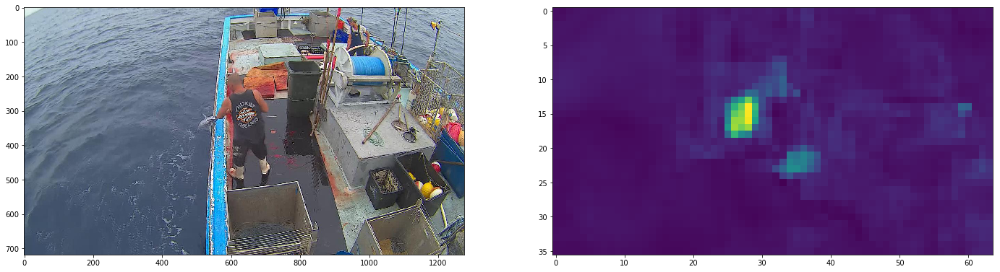

0.942487597466


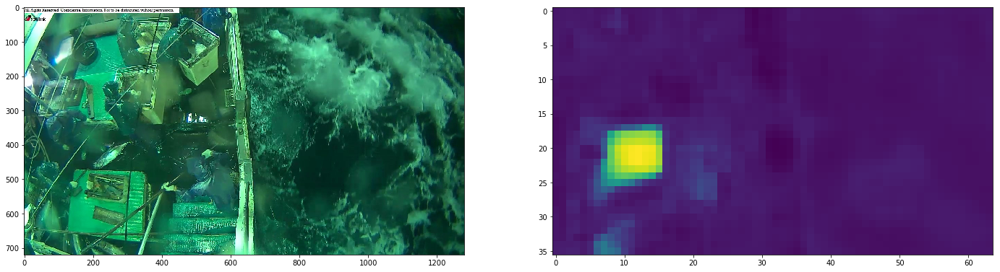

0.973224580288


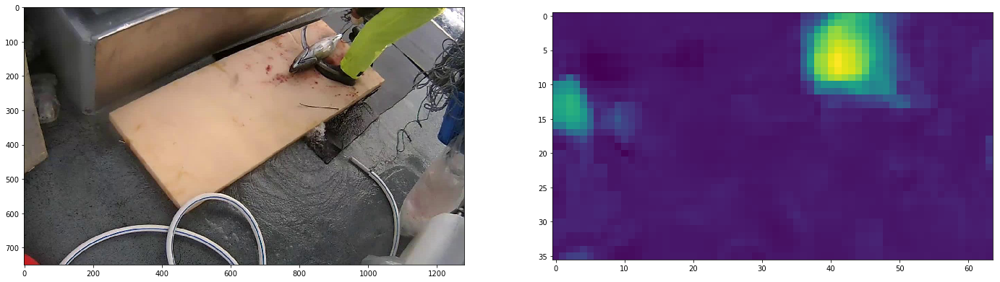

1.04335725307


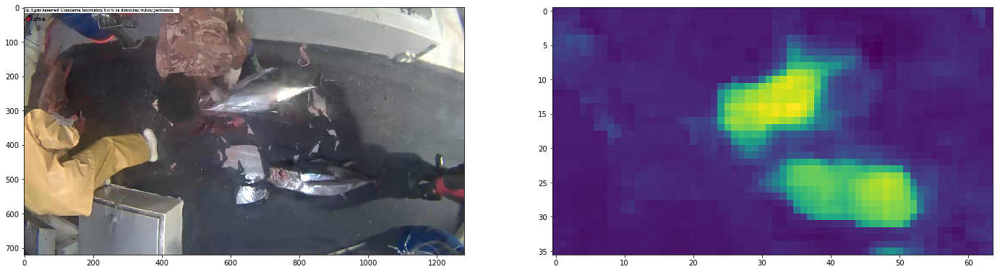

0.552712619305


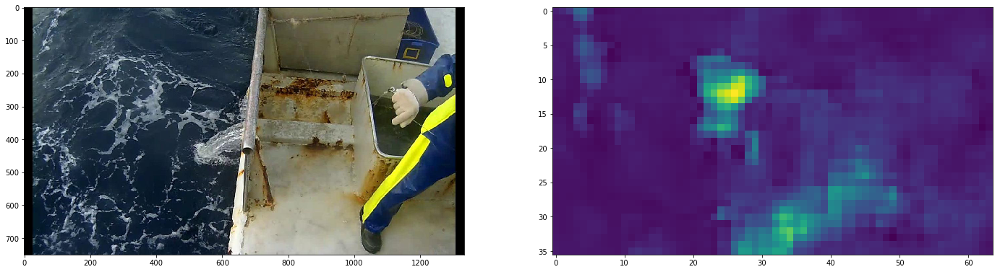

0.781539976597


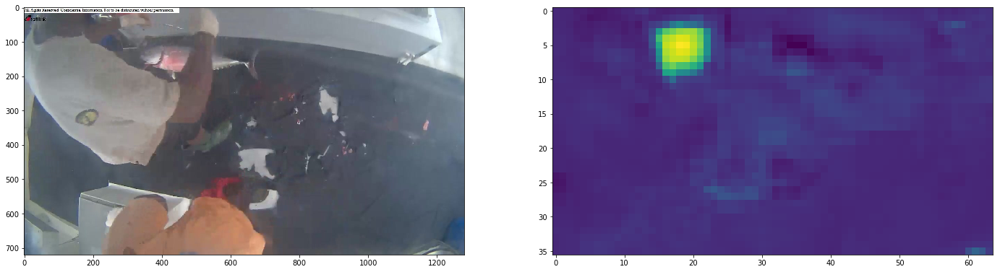

0.714872658253


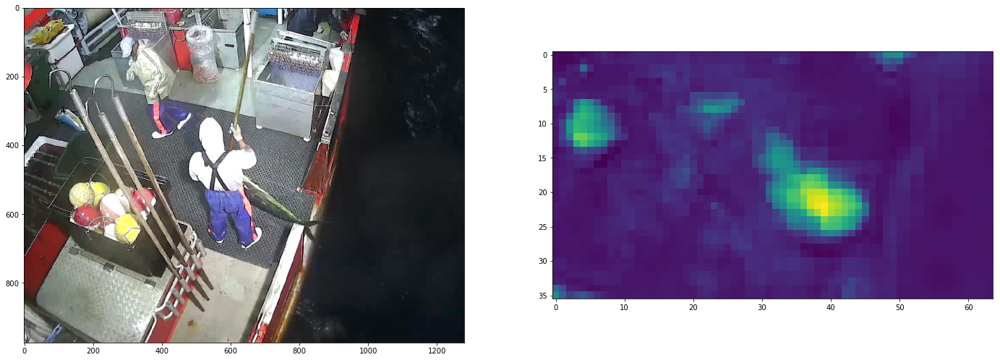

0.782779633999


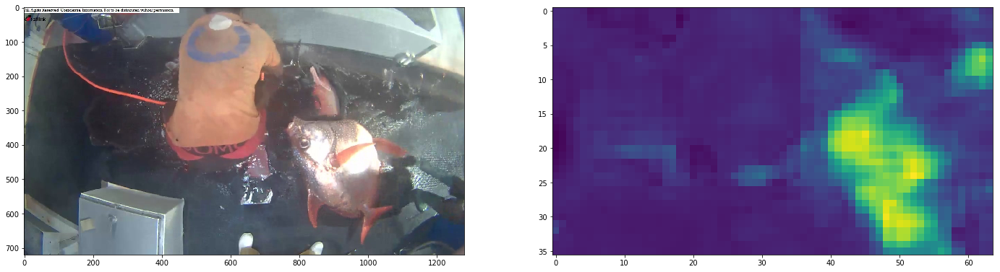

0.481872528791


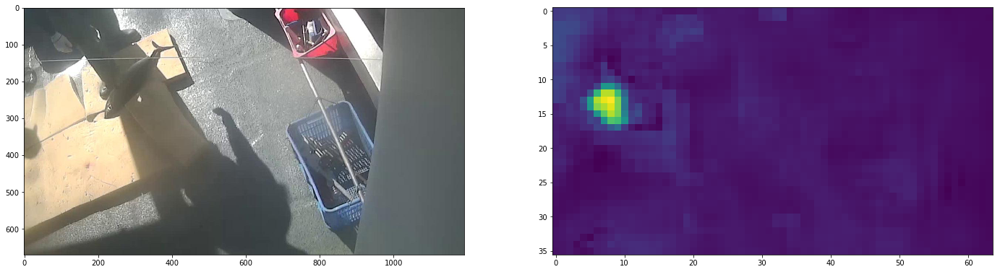

1.14083147049


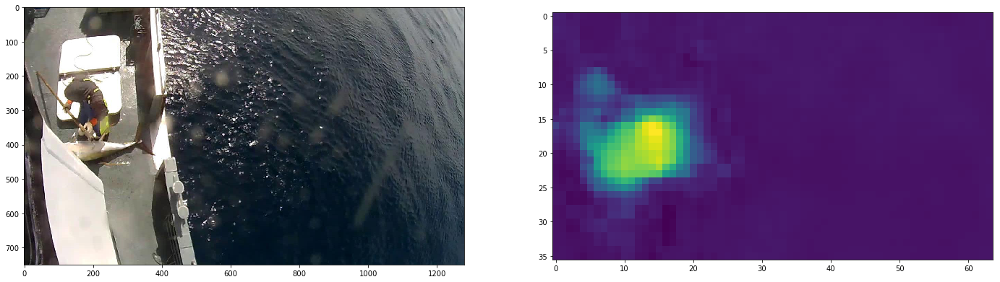

1.09269928932


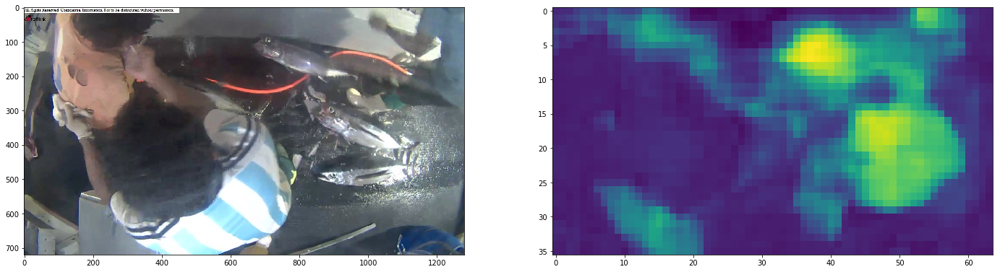

0.42559158802


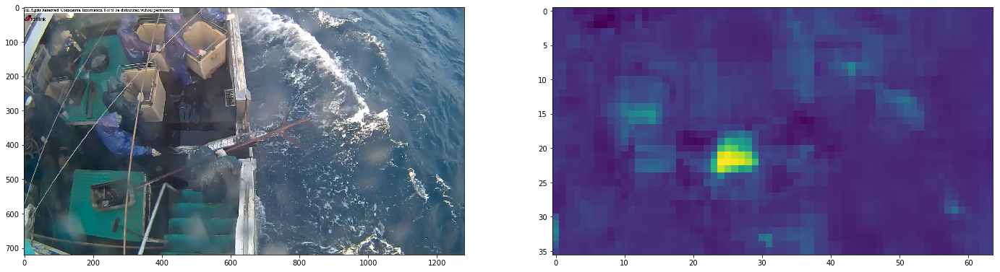

0.627473771572


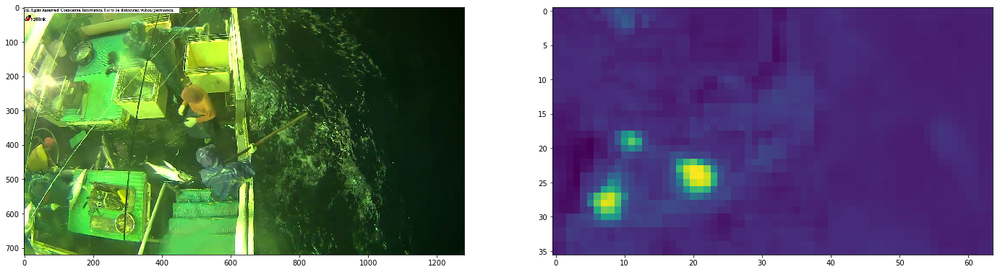

0.957514584064


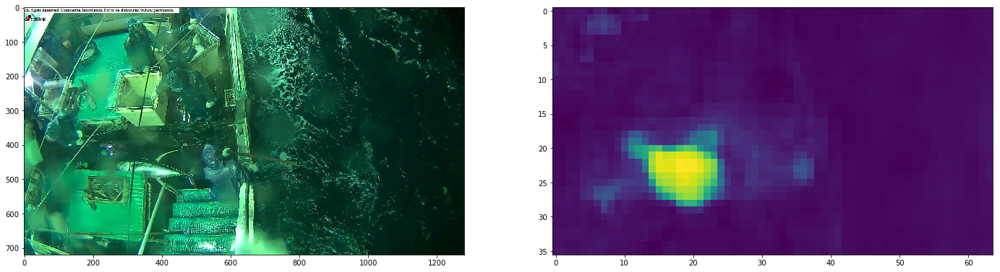

In [8]:
show_heatmaps(heatmaps, pictures_meta, 200, mask_idx=0, nb_to_show = 20)

### We find the boats:

### We find the rectangles:

In [9]:
rectangles, scores = htr.find_rectangles(heatmaps, threshold, ranges, clip, border_conf=border_conf,
                                     batch_size=batch_size, max_fish=max_fish, scores=True)

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpsnof6uqf/m9a6bd0eb5ed5c92e91261282fc495cb4.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpsnof6uqf/m9a6bd0eb5ed5c92e91261282fc495cb4.exp



In [10]:
new_rectangles = resize_rectangles(rectangles, pictures_meta, heatmaps.shape[-1], heatmaps.shape[-2])

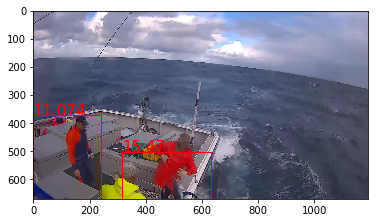

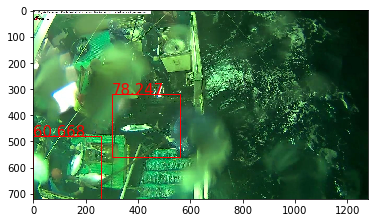

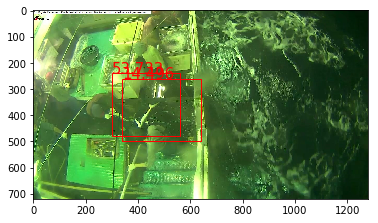

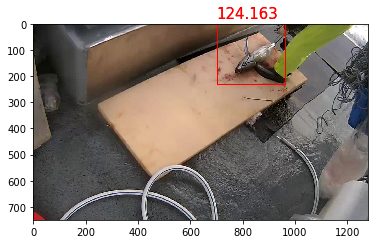

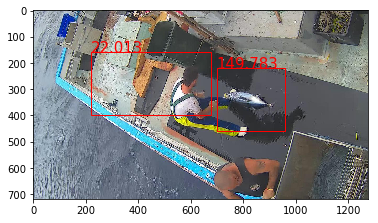

...

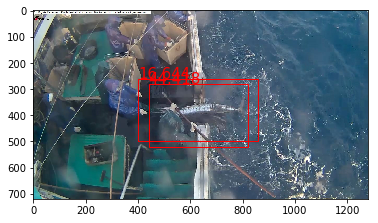

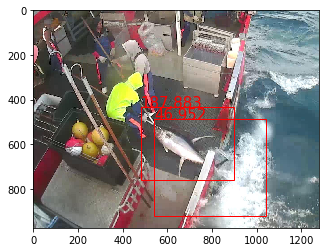

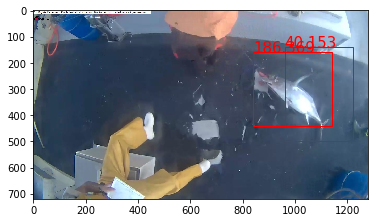

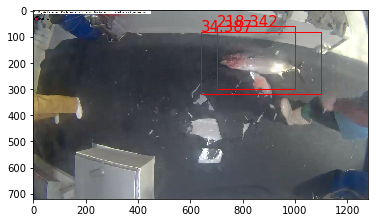

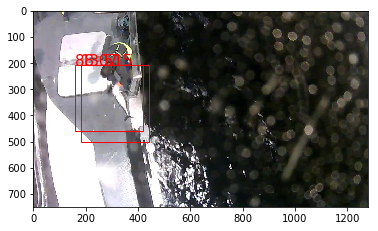

In [120]:
print_rectangles(new_rectangles, scores, pictures_meta, 40, nb_to_show = 20)

### We crop the images:

In [12]:
def crop_images(pictures_meta, new_rectangles):
    cropped = []
    
    for rects, (path, f_name, height, width) in zip(tq(new_rectangles),pictures_meta):
        img_crops = []
        img = load_img(path)
        for rect in rects:
            crop = img.crop((rect[1],rect[0] ,rect[1] + rect[3], rect[0]+ rect[2]))
            crop = crop.resize((int(crop.size[0]*1.75),int(crop.size[1]*1.87)),Image.ANTIALIAS)
            img_crops.append(crop)
        cropped.append(img_crops)
    return cropped

In [13]:
cropped = crop_images(pictures_meta, new_rectangles)

In [119]:
cropped[0][0].size

(455, 448)

### We apply the classifier:

In [65]:
def model_custom_1(nb_input_filters):
    
    img_input = Input(shape=(nb_input_filters, None, None)) 
    
    x = Convolution2D(512, 1, 1, activation='relu')(img_input)
    x = BatchNormalization(axis=1)(x)
    x = Convolution2D(256, 1, 1, activation='relu')(x)
    x = BatchNormalization(axis=1)(x)
    x = Convolution2D(128, 1, 1, activation='relu')(x)
    x = BatchNormalization(axis=1)(x)
    last_filter = 256
    x = Convolution2D(last_filter, 1, 1, activation='relu')(x)
    x = BatchNormalization(axis=1)(x)
    
    return Model(input=img_input,output=x), last_filter

In [69]:
img_input = Input(shape=(2048, None, None))


y = Convolution2D(1000, 1, 1, activation='relu')(img_input)
y = BatchNormalization(axis=1)(y)
bloc1, last_filter = model_custom_1(1000)
y = bloc1(y)
y = GlobalMaxPooling2D()(y)

new_model = Model(input=img_input,output=y)

In [76]:
new_model.layers[1].set_weights(model.layers[1].get_weights())
new_model.layers[2].set_weights(model.layers[2].get_weights())

for new_layer,layer in zip(new_model.layers[3].layers, model.layers[3].layers) :
    new_layer.set_weights(layer.get_weights())

In [72]:
model.layers[1]

In [21]:
model = load_model(path_model_predictions, custom_objects={"Softmax4D": heatmap.Softmax4D})

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpmy1usa8_/m848dd898e26d545ff6290e3aa98de3d5.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpmy1usa8_/m848dd898e26d545ff6290e3aa98de3d5.exp

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmptu5vpzkf/mcaee517fdbbfe5601d70389b5e9a720a.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmptu5vpzkf/mcaee517fdbbfe5601d70389b5e9a720a.exp

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_Genui

In [22]:
model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_1 (InputLayer)             (None, 2048, 36, 64)  0                                            
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 1000, 36, 64)  2049000     input_1[0][0]                    
____________________________________________________________________________________________________
batchnormalization_1 (BatchNorma (None, 1000, 36, 64)  4000        convolution2d_1[0][0]            
____________________________________________________________________________________________________
model_1 (Model)                  multiple              714368      batchnormalization_1[0][0]       
___________________________________________________________________________________________

In [74]:
model.layers[3]

In [60]:
model_extract_features = Model(model.layers[2].input, model.layers[3].get_output_at(1))

C:\Program Files\Anaconda3\lib\site-packages\keras-1.2.1-py3.5.egg\keras\engine\topology.py:1811: UserWarning: Model inputs must come from a Keras Input layer, they cannot be the output of a previous non-Input layer. Here, a tensor specified as input to "model_8" was not an Input tensor, it was generated by layer convolution2d_1.
Note that input tensors are instantiated via `tensor = Input(shape)`.
The tensor that caused the issue was: None
  str(x.name))


RuntimeError: Graph disconnected: cannot obtain value for tensor input_1 at layer "input_1". The following previous layers were accessed without issue: []

In [34]:
resnet = load_model(path_model_precompute)

C:\Program Files\Anaconda3\lib\site-packages\keras-1.2.1-py3.5.egg\keras\models.py:150: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [77]:
# This model takes an image as input and outputs a feature vector
def resnet_extract_features(resnet, model):
    input_img = Input(shape=(3, None, None))
    x = resnet(input_img)
    x = model_extract_features(x)
    x = GlobalMaxPooling2D()(x)
    x = Reshape((256,1,1))(x)
    return Model(input_img, x)

In [78]:
full_pre_model = resnet_extract_features(resnet, model_extract_features)

In [82]:
full_pre_model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
input_19 (InputLayer)            (None, 3, None, None) 0                                            
____________________________________________________________________________________________________
model_2 (Model)                  (None, 2048, None, No 23587712    input_19[0][0]                   
____________________________________________________________________________________________________
model_7 (Model)                  multiple              2767368     model_2[5][0]                    
____________________________________________________________________________________________________
globalmaxpooling2d_11 (GlobalMax (None, 256)           0           model_7[1][0]                    
___________________________________________________________________________________________

In [85]:
def extract_features(cropped, full_pre_model):
    
    p_species = []
    
    for img in tq(cropped):
        p_species_img = []
        for cropped_img in img:
            array = img_to_array(cropped_img)
            array = np.expand_dims(array,0)
            array = preprocess_input(array)
            results = full_pre_model.predict(array)[0]
            p_species_img.append(results)
        p_species.append(p_species_img)
    return p_species
    

In [86]:
p_species = extract_features(cropped, full_pre_model)

In [91]:
len(p_species[0])

2

### We combine the results:

In [109]:
a = Input(shape=(256,1,1))

c = Convolution2D(128, 1, 1, activation='relu')(a)
c = BatchNormalization(axis=1)(c)
c = Convolution2D(128, 1, 1, activation='relu')(c)
c = BatchNormalization(axis=1)(c)
c = Convolution2D(8, 1, 1, activation='relu')(c)
c = heatmap.Softmax4D(axis=1)(c)
c = Flatten()(c)

model4 =  Model(input=a,output=c)

In [111]:
for new_layer,layer in zip(model4.layers, model.layers[8].layers):
    new_layer.set_weights(layer.get_weights())

In [94]:
fused_features = [np.max(x, axis=0) for x in p_species]

In [112]:
a = [model4.predict(np.expand_dims(x,0))[0] for x in fused_features]

In [114]:
a[1]

array([  2.74725549e-04,   6.47927681e-03,   5.03321230e-01,
         7.98390657e-02,   2.74725549e-04,   2.74725549e-04,
         2.74725549e-04,   4.09261435e-01], dtype=float32)

In [72]:
def combine_probabilities(predictions,scores,opt='sum'):
    result = np.zeros((1000,1,8))
    for i in range(1000):
        for j in range(1):
            result[i,j] = np.array(predictions[i][j])*scores[i][j]
    if opt=='sum':  
        #print(np.sum(result.mean(axis=1)/result.mean(axis=1).sum()))
        a = result.mean(axis=1)
        for i in range(1000):
            a[i] = a[i]/np.sum(a[i])
        if a.sum() != 1000:
            print('ERROR')
            return None
        else:
            return a
    if opt=='mul':
        result_f = np.zeros((1000,8))
        for i in range(1000):
            result_f[i] = np.multiply(result[i,0],result[i,1])/np.sum(np.multiply(result[i,0],result[i,1]))
        #print(np.sum(result_f/result_f.sum()))
        a = result_f
        if a.sum() != 1000:
            print('ERROR')
            return None
        else:
            return result_f
           

In [73]:
p_species_array=np.array(p_species)
scores_array = np.array(scores)

In [74]:
final_predictions = combine_probabilities(p_species_array, scores_array,opt='sum')

In [75]:
np.sum(final_predictions[1])

1.0

### Creating the csv:

In [117]:
def create_submission(predictions, info):
    import pandas as pd
    import datetime
    
    
    # WE NEED TO CHANGE THIS PART BECAUSE THE CODES FOR THE CLASSES HAVE CHANGED 
    
    
    
    #result1 = pd.DataFrame(predictions, columns=['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT','image'])
    result1 = pd.DataFrame(predictions, columns=['image','ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT'])
    #result1.loc['image',:] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    sub_file = 'submission_' + info + '_' + str(now.strftime("%Y-%m-%d-%H-%M")) + '.csv'
    result1.to_csv(sub_file, index=False)
    print('done',sub_file)


def to_csv(final_predictions, pictures_meta):
    imgs_name = [x[1] for x in pictures_meta]
    output = []
    for prediction,img_name in zip(np.array(final_predictions).tolist(),imgs_name):
        output.append(np.hstack((np.array(img_name),prediction)))
    create_submission(output,'') 

In [118]:
to_csv(a, pictures_meta) #Must print the submission number

done submission__2017-01-27-00-44.csv
